In [91]:
# BASE
# ------------------------------------------------------
import numpy as np
import pandas as pd
import os
import gc
import warnings
import calendar

# PACF - ACF
# ------------------------------------------------------
import statsmodels.api as sm

# DATA VISUALIZATION
# ------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots


# CONFIGURATIONS
# ------------------------------------------------------
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format
warnings.filterwarnings('ignore')

In [92]:
#Generic helper function to plot time variant data
def plot_series(time, series, format="-", start=0, end=None,title="X",x='x1',y='y1'):
    fig, ax = plt.subplots(figsize=(14,5))
    plt.plot(time[start:end], series[start:end], format)
    plt.xlabel(x,fontsize=16)
    plt.ylabel(y,fontsize=16)
    plt.title(title,fontsize=16)
    plt.grid(True)
    plt.show()
    plt.close()

# Import

In [93]:
# Import different components of the dataset

train = pd.read_csv("./dataset/train.csv")
test = pd.read_csv("./dataset/test.csv")
stores = pd.read_csv("./dataset/stores.csv")
submission = pd.read_csv("./dataset/sample_submission.csv")   
transactions = pd.read_csv("./dataset/transactions.csv")#.sort_values(["store_nbr", "date"])
holidays = pd.read_csv("./dataset/holidays_events.csv")
oil = pd.read_csv("./dataset/oil.csv")

In [94]:
# Changing the data formats of train file
train['date'] = pd.to_datetime(train['date'])
train['onpromotion'] = train['onpromotion'].astype('float16')
train['sales'] = train['sales'].astype('float32')
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00
1,1,2013-01-01,1,BABY CARE,0.00,0.00
2,2,2013-01-01,1,BEAUTY,0.00,0.00
3,3,2013-01-01,1,BEVERAGES,0.00,0.00
4,4,2013-01-01,1,BOOKS,0.00,0.00


In [73]:
# train -- info
print("** Information of train file **")
train.info()
print("\n** Description of train file **\n")
train.describe()

** Information of train file **
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype         
---  ------       -----         
 0   id           int64         
 1   date         datetime64[ns]
 2   store_nbr    int64         
 3   family       object        
 4   sales        float32       
 5   onpromotion  float16       
dtypes: datetime64[ns](1), float16(1), float32(1), int64(2), object(1)
memory usage: 108.8+ MB

** Description of train file **



,id,store_nbr,sales,onpromotion
count,3000888.00,3000888.00,3000888.00,3000888.00
mean,1500443.50,27.50,357.78,NaN
std,866281.89,15.59,1102.00,NaN
min,0.00,1.00,0.00,0.00
25%,750221.75,14.00,0.00,0.00
50%,1500443.50,27.50,11.00,0.00
75%,2250665.25,41.00,195.85,0.00
max,3000887.00,54.00,124717.00,741.00


In [74]:
# Changing the data formats of test file
test['date'] = pd.to_datetime(test['date'])
test['onpromotion'] = test['onpromotion'].astype('float16')
test.head()

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0.00
1,3000889,2017-08-16,1,BABY CARE,0.00
2,3000890,2017-08-16,1,BEAUTY,2.00
3,3000891,2017-08-16,1,BEVERAGES,20.00
4,3000892,2017-08-16,1,BOOKS,0.00


In [75]:
# test -- info
print("** Information of test file **")
test.info()

# test -- description
print("\n** Description of test file **\n")
test.describe()

** Information of test file **
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   id           28512 non-null  int64         
 1   date         28512 non-null  datetime64[ns]
 2   store_nbr    28512 non-null  int64         
 3   family       28512 non-null  object        
 4   onpromotion  28512 non-null  float16       
dtypes: datetime64[ns](1), float16(1), int64(2), object(1)
memory usage: 946.8+ KB

** Description of test file **



,id,store_nbr,onpromotion
count,28512.00,28512.00,28512.00
mean,3015143.50,27.50,inf
std,8230.85,15.59,inf
min,3000888.00,1.00,0.00
25%,3008015.75,14.00,0.00
50%,3015143.50,27.50,0.00
75%,3022271.25,41.00,6.00
max,3029399.00,54.00,646.00


In [76]:
# store -- info
print("** Information of store file **")
stores.info()

# store -- description
print("\n** Description of store file **\n")
stores.describe()

** Information of store file **
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB

** Description of store file **



,store_nbr,cluster
count,54.00,54.00
mean,27.50,8.48
std,15.73,4.69
min,1.00,1.00
25%,14.25,4.00
50%,27.50,8.50
75%,40.75,13.00
max,54.00,17.00


In [130]:
# changing the data formats of transactions file
transactions = transactions.sort_values(["store_nbr","date"])
transactions['date'] = pd.to_datetime(transactions['date'])
transactions.head(10)

,date,store_nbr,transactions
1,2013-01-02,1,2111
47,2013-01-03,1,1833
93,2013-01-04,1,1863
139,2013-01-05,1,1509
185,2013-01-06,1,520
231,2013-01-07,1,1807
277,2013-01-08,1,1869
323,2013-01-09,1,1910
369,2013-01-10,1,1679
415,2013-01-11,1,1813


In [78]:
# transactions -- info
print("** Information of transactions file **")
transactions.info()

# transactions -- description
print("\n** Description of transactions file **\n")
transactions.describe()

** Information of transactions file **
<class 'pandas.core.frame.DataFrame'>
Int64Index: 83488 entries, 1 to 83487
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          83488 non-null  datetime64[ns]
 1   store_nbr     83488 non-null  int64         
 2   transactions  83488 non-null  int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 2.5 MB

** Description of transactions file **



,store_nbr,transactions
count,83488.00,83488.00
mean,26.94,1694.60
std,15.61,963.29
min,1.00,5.00
25%,13.00,1046.00
50%,27.00,1393.00
75%,40.00,2079.00
max,54.00,8359.00


In [158]:
# changing the data formats of holiday file
holidays['date'] = pd.to_datetime(holidays['date'])
holidays.head(10)

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
5,2012-05-12,Holiday,Local,Puyo,Cantonizacion del Puyo,False
6,2012-06-23,Holiday,Local,Guaranda,Cantonizacion de Guaranda,False
7,2012-06-25,Holiday,Regional,Imbabura,Provincializacion de Imbabura,False
8,2012-06-25,Holiday,Local,Latacunga,Cantonizacion de Latacunga,False
9,2012-06-25,Holiday,Local,Machala,Fundacion de Machala,False


In [80]:
# holidays -- info
print("** Information of holidays file **")
holidays.info()

# transactions -- description
print("\n** Description of holidays file **\n")
holidays.describe()

** Information of holidays file **
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         350 non-null    datetime64[ns]
 1   type         350 non-null    object        
 2   locale       350 non-null    object        
 3   locale_name  350 non-null    object        
 4   description  350 non-null    object        
 5   transferred  350 non-null    bool          
dtypes: bool(1), datetime64[ns](1), object(4)
memory usage: 14.1+ KB

** Description of holidays file **



,date,type,locale,locale_name,description,transferred
count,350,350,350,350,350,350
unique,312,6,3,24,103,2
top,2014-06-25 00:00:00,Holiday,National,Ecuador,Carnaval,False
freq,4,221,174,174,10,338
first,2012-03-02 00:00:00,NaN,NaN,NaN,NaN,NaN
last,2017-12-26 00:00:00,NaN,NaN,NaN,NaN,NaN


In [178]:
# changing the data formats of
oil['date'] = pd.to_datetime(oil['date'])
oil.head(5)

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [82]:
# oil -- info
print("** Information of oil file **")
oil.info()

# oil -- description
print("\n** Description of oil file **\n")
oil.describe()

** Information of oil file **
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1218 entries, 0 to 1217
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        1218 non-null   datetime64[ns]
 1   dcoilwtico  1175 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 19.2 KB

** Description of oil file **



,dcoilwtico
count,1175.00
mean,67.71
std,25.63
min,26.19
25%,46.41
50%,53.19
75%,95.66
max,110.62


# Dataset Summary

In [33]:
print(f'Number of data_oil samples: {oil.shape}')
print(f'Number of train_data samples: {train.shape}')
print(f'Number of test_data samples: {test.shape}')
print(f'Number of data_holi samples: {holidays.shape}')
print(f'Number of data_store samples: {stores.shape}')
print(f'Number of data_trans samples: {transactions.shape}')

Number of data_oil samples: (1218, 2)
Number of train_data samples: (3000888, 6)
Number of test_data samples: (28512, 5)
Number of data_holi samples: (350, 6)
Number of data_store samples: (54, 5)
Number of data_trans samples: (83488, 3)


In [34]:
fig=go.Figure()
fig.add_trace(go.Scatter(
    x=[0, 1, 2, 3],
    y=[1.6, 1.6, 1.6, 1.6],
    mode="text", 
    text=["<span style='font-size:33px'><b>54</b></span>", 
          "<span style='font-size:33px'><b>33</b></span>",
          "<span style='font-size:33px'><b>16</b></span>",
          "<span style='font-size:33px'><b>56</b></span>"],
    textposition="bottom center"
))
fig.add_trace(go.Scatter(
    x=[0, 1, 2, 3],
    y=[1.1, 1.1, 1.1, 1.1],
    mode="text", 
    text=["Stores", "Products", "States", "Months"],
    textposition="bottom center"
))
fig.add_hline(y=2.2, line_width=5, line_color='gray')
fig.add_hline(y=0.3, line_width=3, line_color='gray')
fig.update_yaxes(visible=False)
fig.update_xaxes(visible=False)
fig.update_layout(showlegend=False, height=300, width=700, 
                  title='Store Sales Summary', title_x=0.5, title_y=0.9,
                  xaxis_range=[-0.5,3.6], yaxis_range=[-0.2,2.2],
                  plot_bgcolor='#fafafa', paper_bgcolor='#fafafa',
                  font=dict(size=23, color='#323232'),
                  title_font=dict(size=35, color='#222'),
                  margin=dict(t=90,l=70,b=0,r=70), 
    )
fig.show()

# EDA: Train (Sales)

Checking for nan values. The train file does not contain any nan values. We are good to go now.

In [35]:
train.isna().sum()

id             0
date           0
store_nbr      0
family         0
sales          0
onpromotion    0
dtype: int64

In [36]:
train['day_of_week'] = train['date'].dt.dayofweek
train['month'] = train['date'].dt.month
train['year'] = train['date'].dt.year

In [37]:
train.head()

,id,date,store_nbr,family,sales,onpromotion,day_of_week,month,year
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,1,1,2013
1,1,2013-01-01,1,BABY CARE,0.00,0.00,1,1,2013
2,2,2013-01-01,1,BEAUTY,0.00,0.00,1,1,2013
3,3,2013-01-01,1,BEVERAGES,0.00,0.00,1,1,2013
4,4,2013-01-01,1,BOOKS,0.00,0.00,1,1,2013


In [38]:
data_grouped_day = train.groupby(['day_of_week']).mean()['sales']#.reset_index()
data_grouped_month = train.groupby(['month']).mean()['sales']
data_grouped_year = train.groupby(['year']).mean()['sales']

fig = make_subplots(rows=1, cols=3, subplot_titles=('Sales - Day of Week', 'Sales - Month', 'Sales - Year'))

# Day of Week subplot
day_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
fig.add_trace(go.Bar(x=day_names, y=list(data_grouped_day.values), marker=dict(color=list(data_grouped_day.values), colorscale='Viridis')), row=1, col=1)
fig.update_xaxes(title_text='Day of Week', row=1, col=1, tickangle=-90)
fig.update_yaxes(title_text='Mean Sales', row=1, col=1, title_standoff=1)

# Month subplot
month_names = [calendar.month_name[i] for i in range(1, 13)]
fig.add_trace(go.Bar(x=month_names, y=list(data_grouped_month.values), marker=dict(color=list(data_grouped_month.values), colorscale='Viridis')), row=1, col=2)
fig.update_xaxes(title_text='Month', row=1, col=2, tickangle=-90)
fig.update_yaxes(title_text='Mean Sales', row=1, col=2, title_standoff=1)

# Year subplot
fig.add_trace(go.Bar(x=list(data_grouped_year.index), y=list(data_grouped_year.values), marker=dict(color=list(data_grouped_year.values), colorscale='Viridis')), row=1, col=3)
fig.update_xaxes(title_text='Year', row=1, col=3, tickangle=-90, title_standoff=48, tickvals=list(data_grouped_year.index), ticktext=list(data_grouped_year.index))
fig.update_yaxes(title_text='Mean Sales', row=1, col=3, title_standoff=1)

# Update subplot layout
fig.update_layout(height=400, width=1000, showlegend=False)

# Show the plot
fig.show(renderer='vscode')

From the above figure, we can say that the most sales were created on weekends (Saturday, Sunday) of each month with highest sale recorded on end of year (December). The sales increased yearly.

In [39]:
# Daily total sales in different stores
a = pd.DataFrame(train.set_index("date").groupby(["store_nbr"]).resample("D").sales.sum().reset_index())
fig = px.line(a, x = "date", y= "sales",color="store_nbr", title = "Daily total sales of the stores")
fig.show(renderer ='browser')

In [42]:
import pandas as pd
import plotly.graph_objs as go
import plotly.io as pio



# Aggregate the sales data
a = train.set_index("date").groupby(["store_nbr"]).resample("D").sales.sum().reset_index()
# Create traces for each store
fig = go.Figure()
#traces = []


for contestant, group in a.groupby("store_nbr"):
    fig.add_trace(go.Scatter(x=list(group["date"]), y=list(group["sales"].values),name=contestant,
                             hovertemplate="Store=%s<br>Date=%%{x}<br>sales=%%{y}<extra></extra>"% contestant))
'''fig.update_layout(legend_title_text = "Contestant")
fig.update_xaxes(title_text="date")
fig.update_yaxes(title_text="sales")'''
fig.update_layout(
    title=dict(
        text="Daily Total Sales of the Stores",
        x=0.5,  # Centers the title
        xanchor="center"  # Ensures proper centering
    ),
    xaxis_title="Date",
    yaxis_title="Sales",
    #legend=dict(
    #    title="Contestant",  # Rename legend title
    #    orientation="h",  # Make the legend horizontal
    #    yanchor="auto", 
    #    y=-0.7,  # Move it below the chart
    #    xanchor="auto", 
    #    x=0.5,
    #),
    margin=dict(l=40, r=40, t=40, b=100)  # Add space for the legend
)
fig.show(renderer='vscode',scale=3)

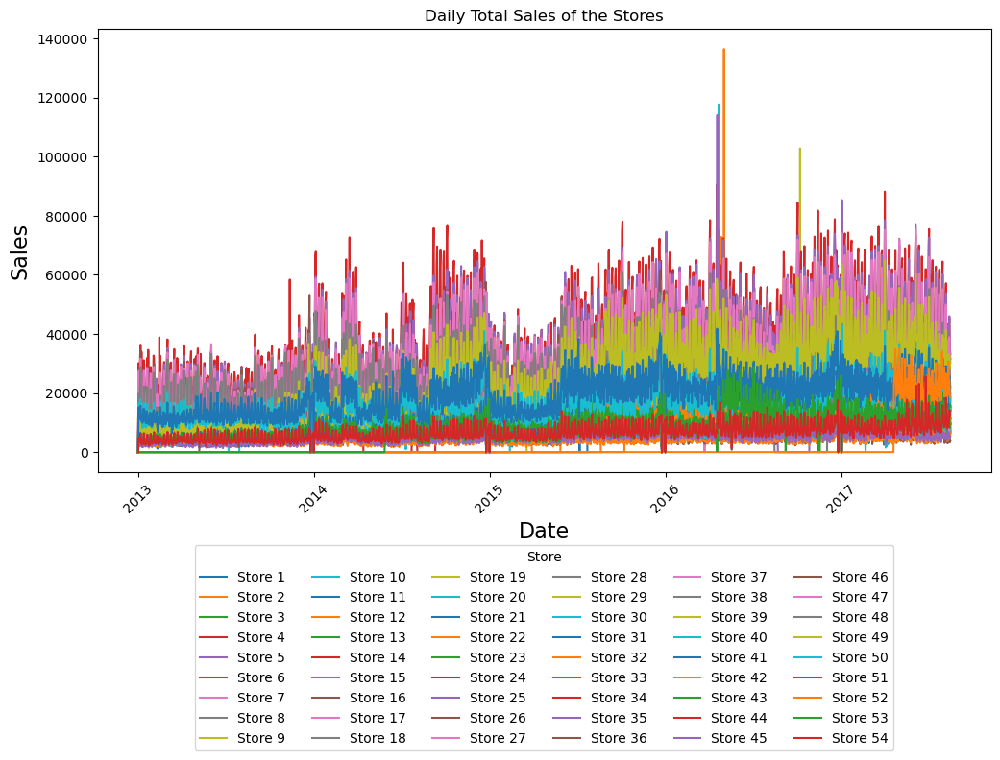

In [41]:
import matplotlib.pyplot as plt
import pandas as pd

# Aggregate sales data
a = train.set_index("date").groupby(["store_nbr"]).resample("D").sales.sum().reset_index()

# Create the plot
plt.figure(figsize=(12, 6))

# Loop through each store and plot the sales trend
for store, group in a.groupby("store_nbr"):
    plt.plot(group["date"], group["sales"], label=f"Store {store}")

# Labels and title
plt.xlabel("Date",fontsize=16)
plt.ylabel("Sales",fontsize=16)
plt.title("Daily Total Sales of the Stores")
plt.legend(title="Store", loc="upper center", bbox_to_anchor=(0.5, -0.15), ncol=6)  # Adjust ncol for better spacing

#plt.legend(title="Store")

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.show()


In [ ]:
'''train_aux = train[['date', 'sales', 'onpromotion']].groupby('date').mean()
train_aux = train_aux.reset_index()
fig = go.Figure(data=go.Scatter(x=train_aux['date'].tolist(), 
                                y=train_aux['sales'].tolist(),
                                marker_color='red', text="sales"))
fig.update_layout(title=dict(
        text="Avg Sales by date for all stores and products",
        x=0.5,  # Centers the title
        xanchor="center"  # Ensures proper centering
        ),xaxis_title="Date",yaxis_title="Sales",showlegend=False)
fig.show()'''

In [ ]:
# Missing date in train data
train_start = train.date.min().date()
train_end = train.date.max().date()
missing_dates = pd.date_range(train_start, train_end).difference(train.date.unique())
missing_dates = missing_dates.strftime("%Y-%m-%d").tolist()

missing_dates 

In [ ]:
# Lets assume the stores were closed on these missing dates and fill the data with zeros

# reindex training data
multi_idx = pd.MultiIndex.from_product([pd.date_range(train_start, train_end), 
                                        train.store_nbr.unique(), 
                                        train.family.unique()],
                                        names=["date", "store_nbr", "family"],)
#print(multi_idx)
train = train.set_index(["date", "store_nbr", "family"]
                                 ).reindex(multi_idx).reset_index()
# fill missing values with 0s
train[["sales", "onpromotion"]] = train[["sales", "onpromotion"]].fillna(0.)
# interpolate  for the 'id'
train.id = train.id.interpolate(method="linear")

train.head(10)

`onpromotion`: gives the total number of items in a product family that were being promoted at a store at a given date.

I belive there is a correlation between the sales and onpromotion variables that deserve to investigate.

The correlation between sales & onpromotion is:  0.5749 



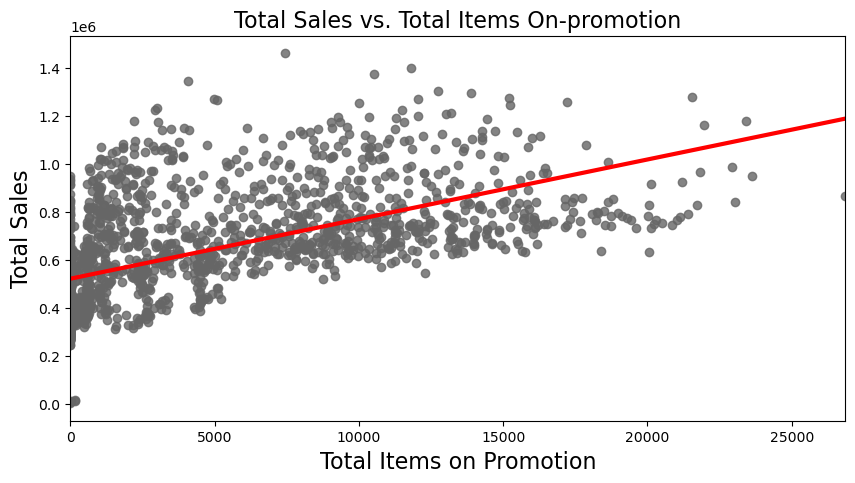

In [146]:
train_eda = train.copy()
avg_sales=train_eda.groupby(['date'])['sales','onpromotion'].sum().reset_index() 

print('The correlation between sales & onpromotion is: ',
      np.round(avg_sales[['sales','onpromotion']].corr().iloc[0,1],4),'\n')

plt.figure(figsize=(10,5))
sns.regplot(data=avg_sales,x='onpromotion',y='sales',ci=None,
            scatter_kws={'color':'0.4'},line_kws={'color':'red','linewidth':3})
plt.xlabel('Total Items on Promotion',fontsize=16)
plt.ylabel('Total Sales',fontsize=16)
plt.title('Total Sales vs. Total Items On-promotion',fontsize=16)
plt.show()

* There is a positive correlation between onpromotion and sales units sold. Thus, when more items are on promotion, it's more likely to sell them.

In [267]:
import plotly.graph_objects as go

# Group by 'family' and calculate mean sales
a = train.groupby("family").sales.mean().sort_values(ascending=False).reset_index()

# Create the bar chart
fig = go.Figure()

fig.add_trace(go.Bar(
    y=a["family"].tolist(), 
    x=a["sales"].tolist(), 
    orientation="h",  # Horizontal bar chart
    marker=dict(color=a["sales"].tolist(), colorscale="Viridis"),  # Color based on sales values
))

# Update layout
fig.update_layout(
    title=dict(
        text="Which Product Family is Preferred More?",
        font=dict(size=20),  # Title font size
        x=0.5,  # Centers the title
        xanchor="center"  # Ensures proper centering
    ),
    xaxis=dict(
        title="Average Sales",
        title_font=dict(size=16),  # X-axis title font size
        tickfont=dict(size=12),  # X-axis tick labels font size
    ),
    yaxis=dict(
        title="Product Family",
        tickvals=a["family"].tolist(),
        title_font=dict(size=16),  # Y-axis title font size
        tickfont=dict(size=12),  # Y-axis tick labels font size
        categoryorder="total ascending",
    ),
    #yaxis=dict(categoryorder="total ascending"),  # Sorts categories by sales
    height=600,  # Adjust height to accommodate long labels
)

# Show figure
fig.show()


In [257]:
import plotly.graph_objects as go

# Group by 'store_nbr' and calculate mean sales
temp = train_eda.groupby("store_nbr")["sales"].mean().sort_values(ascending=False).to_frame()

# Convert index to string for x-axis labels
store_numbers = temp.index.astype(str)
sales_values = temp["sales"].tolist()

# Create the bar chart
fig = go.Figure()

fig.add_trace(go.Bar(
    x=store_numbers,  
    y=sales_values, 
    marker=dict(color=sales_values, colorscale="Viridis"),  # Color gradient
))

# Ensure all store numbers are displayed on the x-axis with larger fonts
fig.update_layout(
    title=dict(
        text="Avg. Sales by Store No.",
        font=dict(size=20),  # Title font size
        x=0.5,  # Centers the title
        xanchor="center"  # Ensures proper centering
    ),
        
    xaxis=dict(
        title="Store No.",
        tickmode="linear",  # Ensure all ticks are shown
        tickvals=store_numbers,  # Display all store numbers
        tickangle=90,  # Rotate labels for better visibility
        title_font=dict(size=16),  # X-axis title font size
        tickfont=dict(size=12),  # X-axis tick labels font size
    ),
    yaxis=dict(
        title="Avg. Sales",
        title_font=dict(size=16),  # Y-axis title font size
        tickfont=dict(size=12),  # Y-axis tick labels font size
    ),
    height=400
)

# Show figure
fig.show()

# Print the best and worst stores
print("The best stores No. sell are:", list(temp.index[:5]))
print("\nThe worst stores No. sell are:", list(temp.index[-5:]))


The best stores No. sell are: [44, 45, 47, 3, 49]

The worst stores No. sell are: [35, 30, 32, 22, 52]


In [269]:
import plotly.graph_objects as go

# Group by 'store_nbr' and calculate mean sales
temp = train_eda.groupby("store_nbr")["sales"].mean().sort_values(ascending=False).to_frame()

# Convert index to string for x-axis labels
store_numbers = temp.index.astype(str)
sales_values = temp["sales"].tolist()

# Create the bar chart
fig = go.Figure()

fig.add_trace(go.Bar(
    x=store_numbers,  
    y=sales_values, 
    marker=dict(color=sales_values, colorscale="Viridis"),  # Color gradient
))

# Ensure all store numbers are displayed on the x-axis
fig.update_layout(
    title=dict(
        text="Avg. Sales by Store No.",
        font=dict(size=20),  # Title font size
        x=0.5,  # Centers the title
        xanchor="center"  # Ensures proper centering
    ),
        
    xaxis=dict(
        title="Store No.",
        tickmode="linear",  # Ensure all ticks are shown
        tickvals=store_numbers,  # Display all store numbers
        tickangle=90,  # Rotate labels for better visibility
        title_font=dict(size=16),  # X-axis title font size
        tickfont=dict(size=12),  # X-axis tick labels font size
    ),
    yaxis=dict(
        title="Avg. Sales",
        title_font=dict(size=16),  # Y-axis title font size
        tickfont=dict(size=12),  # Y-axis tick labels font size
    ),
    height=500
)

# Show figure
fig.show()

# Print the best and worst stores
print("The best stores No. sell are:", list(temp.index[:5]))
print("\nThe worst stores No. sell are:", list(temp.index[-5:]))


The best stores No. sell are: [44, 45, 47, 3, 49]

The worst stores No. sell are: [35, 30, 32, 22, 52]


# EDA: Oil

In [23]:
# Missing data in oil data 
oil = oil.set_index("date").dcoilwtico.resample("D").sum().reset_index()
# we replace the missing value with imputation
# Interpolate
oil["dcoilwtico"] = np.where(oil["dcoilwtico"] == 0, np.nan, oil["dcoilwtico"])
oil["dcoilwtico_interpolated"] =oil.dcoilwtico
oil.dcoilwtico_interpolated.interpolate(limit_direction='both',inplace=True)

p = oil.melt(id_vars=['date']+list(oil.keys()[5:]), var_name='Legend')
px.line(p.sort_values(["Legend", "date"], ascending = [False, True]), x='date', y='value', color='Legend',title = "Daily Oil Price" )

In [7]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# Handling Missing Data in Oil Prices
oil = oil.set_index("date").dcoilwtico.resample("D").sum().reset_index()

# Replace zero values with NaN for interpolation
oil["dcoilwtico"] = np.where(oil["dcoilwtico"] == 0, np.nan, oil["dcoilwtico"])

# Create a new column for interpolated values
oil["dcoilwtico_interpolated"] = oil["dcoilwtico"]
oil["dcoilwtico_interpolated"].interpolate(limit_direction="both", inplace=True)

# Prepare Data for Plotting
fig = go.Figure()

# Interpolated Oil Prices
fig.add_trace(go.Scatter(
    x=oil["date"].tolist(), 
    y=oil["dcoilwtico_interpolated"].tolist(), 
    mode="lines", 
    name="Interpolated Oil Price",
    line=dict(color="blue"),  # Solid blue line for interpolated data
    hoverinfo="x+y"
))

# Original Oil Prices
fig.add_trace(go.Scatter(
    x=oil["date"].tolist(), 
    y=oil["dcoilwtico"].tolist(), 
    mode="lines", 
    name="Original Oil Price",
    line=dict(color="red"),  # Dashed red line for original
    hoverinfo="x+y"
))



# Layout Settings
fig.update_layout(
    title=dict(
        text="Daily Oil Price",
        x=0.5,  # Centers the title
        xanchor="center"  # Ensures proper centering
    ),
    xaxis_title="Date",
    yaxis_title="Oil Price (USD)",
    legend_title="Legend",
    template="plotly_white"
)

# Show Plot
fig.show()


In [25]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# Handling Missing Data in Oil Prices
oil = oil.set_index("date").dcoilwtico.resample("D").sum().reset_index()

# Replace zero values with NaN for interpolation
oil["dcoilwtico"] = np.where(oil["dcoilwtico"] == 0, np.nan, oil["dcoilwtico"])

# Create a new column for interpolated values
oil["dcoilwtico_interpolated"] = oil["dcoilwtico"]
oil["dcoilwtico_interpolated"].interpolate(limit_direction="both", inplace=True)

# Prepare Data for Plotting
fig = go.Figure()

# Interpolated Oil Prices
fig.add_trace(go.Scatter(
    x=oil["date"].tolist(), 
    y=oil["dcoilwtico_interpolated"].tolist(), 
    mode="lines", 
    name="Interpolated Oil Price",
    line=dict(color="blue"),  # Solid blue line for interpolated data
    hoverinfo="x+y"
))

# Original Oil Prices
fig.add_trace(go.Scatter(
    x=oil["date"].tolist(), 
    y=oil["dcoilwtico"].tolist(), 
    mode="lines", 
    name="Original Oil Price",
    line=dict(color="red", dash="dash"),  # Dashed red line for original
    hoverinfo="x+y"
))

# Layout Settings
fig.update_layout(
    title=dict(
        text="Daily Oil Price",
        x=0.5,  # Centers the title
        xanchor="center"
    ),
    xaxis_title="Date",
    yaxis_title="Oil Price (USD)",
    legend=dict(
        title="Legend",
        x=1,  # Position at the right
        y=1,  # Position at the top
        xanchor="right",
        yanchor="top",
        bgcolor="rgba(255,255,255,0.7)",  # Semi-transparent background
        bordercolor="black",
        borderwidth=1
    ),
    template="plotly_white"
)

# Show Plot
fig.show()


date                         0
dcoilwtico                 529
dcoilwtico_interpolated      0
dtype: int64


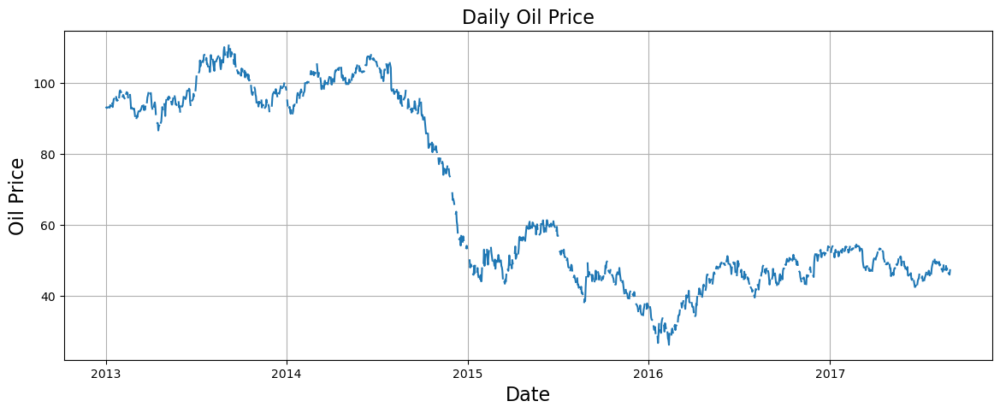

In [8]:
print(oil.isna().sum())
plot_series(oil["date"], oil["dcoilwtico"], format="-", start=0, end=None,title='Daily Oil Price',x='Date',y='Oil Price')

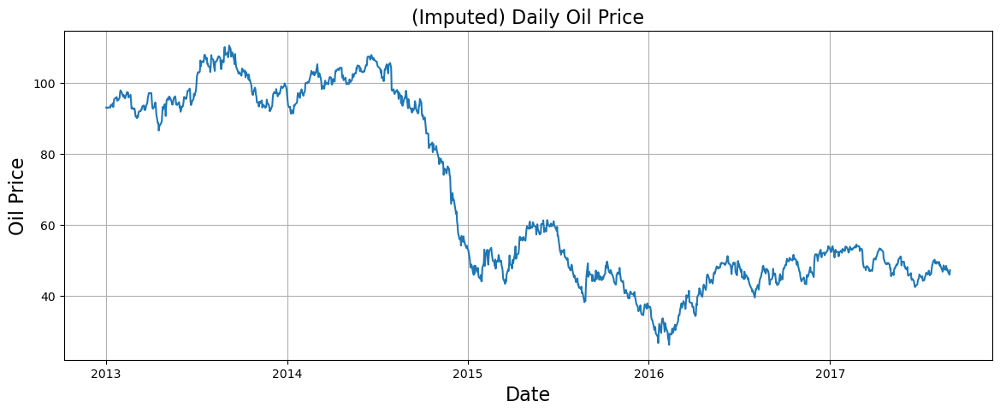

In [9]:
oil["dcoilwtico"] = np.where(oil["dcoilwtico"] == 0, np.nan, oil["dcoilwtico"])
oil["dcoilwtico_interpolated"] =oil.dcoilwtico
oil.dcoilwtico_interpolated.interpolate(limit_direction='both',inplace=True)
plot_series(oil["date"], oil["dcoilwtico_interpolated"], format="-", start=0, end=None,title='(Imputed) Daily Oil Price',x='Date',y='Oil Price')

# EDA: Transactions

In [84]:
import calendar
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create a single subplot for Transactions by Month
fig = make_subplots(rows=1, cols=1, subplot_titles=("Transactions by Month",))

# Define colors for months
colors_month = [
    'red', 'green', 'blue',
    'magenta', 'yellow', 'brown',
    'pink', 'darkgrey', 'orange',
    'darkblue', 'olive', 'purple'
]

years = transactions['date'].dt.year.unique()
for year in years:
    trace_data = []
    for month in range(1, 13):
        data_month = transactions[(transactions['date'].dt.year == year) & (transactions['date'].dt.month == month)]
        trace = go.Box(
            x=[f"{calendar.month_abbr[month]}-{year}"] * len(data_month['transactions']), 
            y=data_month['transactions'].tolist(),
            boxpoints='outliers', 
            jitter=0.4, 
            pointpos=0,
            marker=dict(color=colors_month[month - 1]),
            name=f"{calendar.month_abbr[month]}-{year}"
        )
        trace_data.append(trace)

    fig.add_traces(trace_data, rows=[1] * len(trace_data), cols=[1] * len(trace_data))

# Update X and Y axes
fig.update_xaxes(
    title_text="Month-Year", 
    tickvals=[f"{calendar.month_abbr[month]}-{year}" for year in years for month in range(1, 13)],
    ticktext=[f"{calendar.month_abbr[month]}-{year}" for year in years for month in range(1, 13)], 
    row=1, col=1
)
fig.update_yaxes(title_text="Transactions", row=1, col=1)

# Update layout
fig.update_layout(
    height=700, width=1000, 
    showlegend=True
)

# Show the plot
fig.show()


In [95]:
import plotly.graph_objects as go
import numpy as np
import pandas as pd

# Sample Data (Replace with actual data)
# train = pd.DataFrame({
#     'transactions': np.random.randint(50, 500, 200),
#     'sales': np.random.uniform(1000, 50000, 200)
# })
tr_ts = pd.merge()

# Group by transactions and compute mean sales
data_sales_tr = train.groupby(['transactions'], as_index=False)['sales'].mean()

# Perform linear regression
slope, intercept = np.polyfit(data_sales_tr.transactions, data_sales_tr.sales, 1)

# Create figure
fig = go.Figure()

# Scatter Plot of Transactions vs. Sales
fig.add_trace(go.Scatter(
    x=data_sales_tr.transactions,
    y=data_sales_tr.sales,
    mode='markers',
    marker=dict(color='blue', size=6, opacity=0.7),
    name="Data Points"
))

# Regression Line
fig.add_trace(go.Scatter(
    x=data_sales_tr.transactions,
    y=slope * data_sales_tr.transactions + intercept,
    mode='lines',
    line=dict(color='red', width=3),
    name="Regression Line"
))

# Layout settings
fig.update_layout(
    title=dict(text="Average Sales vs. Store Transactions", x=0.5, xanchor="center"),
    xaxis_title="Transactions",
    yaxis_title="Average Sales",
    template="plotly_white"
)

# Show plot
fig.show()


KeyError: 'transactions'

# EDA: Total sales vs transactions

In [98]:
transactions

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922
...,...,...,...
83483,2017-08-15,50,2804
83484,2017-08-15,51,1573
83485,2017-08-15,52,2255
83486,2017-08-15,53,932


In [141]:
train

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00
1,1,2013-01-01,1,BABY CARE,0.00,0.00
2,2,2013-01-01,1,BEAUTY,0.00,0.00
3,3,2013-01-01,1,BEVERAGES,0.00,0.00
4,4,2013-01-01,1,BOOKS,0.00,0.00
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.13,0.00
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.55,1.00
3000885,3000885,2017-08-15,9,PRODUCE,2419.73,148.00
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.00,8.00


In [142]:
train_eda = train.copy() ## Initializing a copy of train dataset for EDA purpose,
##                          and to preserve the original train dataset
train_eda=train_eda.set_index('date')
temp = train_eda.groupby(train_eda.index.day_of_week)['sales'].mean().to_frame()

The correlation between total sales & transactions is:  0.8374 



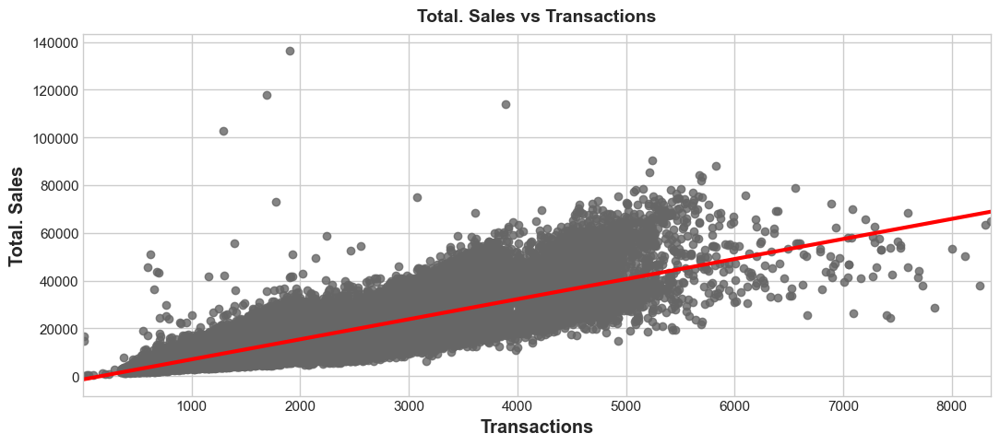

In [176]:
avg_sales = train_eda.groupby(['date','store_nbr'])['sales'].sum().reset_index() ## Grouping by store_nbr

temp = pd.merge(avg_sales, transactions, how = "left") ## Merging 

print('The correlation between total sales & transactions is: ',
      np.round(temp[['sales','transactions']].corr().iloc[0,1],4),'\n')

# Plotting
sns.regplot(data=temp,x='transactions',y='sales',ci=None,
            scatter_kws={'color':'0.4'},line_kws={'color':'red','linewidth':3})
plt.xlabel('Transactions')
plt.ylabel('Total. Sales')
plt.title('Total. Sales vs Transactions')
plt.show()

# EDA: Holidays vs Sales 

I belive that this holidays and event dataset has a large correlation with train dataset, So Let's get some useful sale indicators from it.



In [147]:
holidays

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
...,...,...,...,...,...,...
345,2017-12-22,Additional,National,Ecuador,Navidad-3,False
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False
348,2017-12-25,Holiday,National,Ecuador,Navidad,False


* As described at metadata, "Pay special attention to the transferred column.
A holiday that is transferred officially falls on that calendar day, 
but was moved to another date by the government." So I will get rid holidays that were transferred
and holidays that are announced a Work day, in addition to dates that are duplicated.

In [148]:
holidays_events = holidays.copy()
holidays_events= holidays_events.loc[(holidays_events.transferred==False) & (holidays_events.type != 'Work Day')]
holidays_events=holidays_events.drop_duplicates(subset='date')  ## Drop duplicated dates

In [150]:
holidays_events

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
...,...,...,...,...,...,...
344,2017-12-22,Holiday,Local,Salinas,Cantonizacion de Salinas,False
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False
348,2017-12-25,Holiday,National,Ecuador,Navidad,False


One important thing is to check if average sales are more at Holidays & Events than work days. In next sections, I will investigate that, in addition I need to know which holidays their impact is significant on average sales, so we can use it as indecator for sales prediction model training.

Holidays dataset has column distinguishes between "local", "National", "Regional" holidays, So I will get insights from average sales during these three types of holidays.

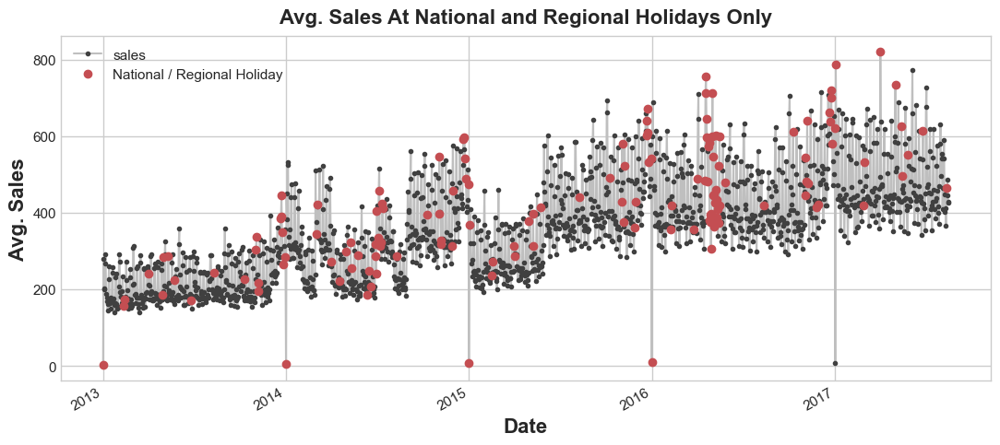

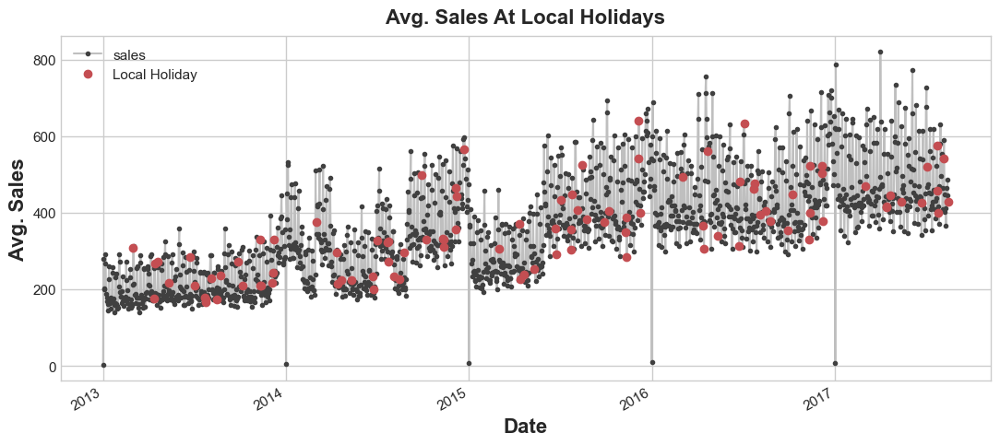

In [170]:
sns.set(color_codes=True)        
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11, 5))
plt.rc("axes", labelweight="bold", labelsize="large", titleweight="bold", titlesize=14, titlepad=10)
plot_params = dict(color="0.75", style=".-", markeredgecolor="0.25", markerfacecolor="0.25", legend=False)
avg_sales = train_eda.groupby('date')['sales'].mean().to_frame()
plot_params = dict(color="0.75", style=".-", markeredgecolor="0.25", markerfacecolor="0.25", legend=False)
## National and Regional Holidays Only

NRHolidays=holidays_events.loc[holidays_events['locale']!='Local',:]
#print(NRHolidays)
NRHolidays_avg_sales=avg_sales.reset_index().merge(NRHolidays,on='date',how='left')
x_cor=NRHolidays_avg_sales.loc[NRHolidays_avg_sales['type'].notna(),'date'].values

y_cor=NRHolidays_avg_sales.loc[NRHolidays_avg_sales['type'].notna(),'sales'].values
_=avg_sales['sales'].plot(**plot_params)
_=plt.plot_date(x_cor,y_cor,color='C3', label='National / Regional Holiday')
_= plt.xlabel('Date',fontsize=16)
_=plt.ylabel('Avg. Sales',fontsize=16)
_=plt.title('Avg. Sales At National and Regional Holidays Only',fontsize=16)
_=plt.legend()

plt.show()

## LocalHolidays Only
LHolidays=holidays_events.loc[holidays_events['locale']=='Local',:]
LHolidays_avg_sales=avg_sales.reset_index().merge(LHolidays,on='date',how='left')
x_cor=LHolidays_avg_sales.loc[LHolidays_avg_sales['type'].notna(),'date'].values
y_cor=LHolidays_avg_sales.loc[LHolidays_avg_sales['type'].notna(),'sales'].values
_=avg_sales['sales'].plot(**plot_params)
_=plt.plot_date(x_cor,y_cor,color='C3', label='Local Holiday')
_= plt.xlabel('Date',fontsize=16)
_=plt.ylabel('Avg. Sales',fontsize=16)
_=plt.title('Avg. Sales At Local Holidays',fontsize=16)
_=plt.legend()

plt.show()

Indeed, there is a differance between those three holiday types, Sales at Local holidays has no significant impact than another normal days, while sales at National/ Regional holidays are more significant for sales versus another days.

I will get rid Local holidays.



In [171]:
holidays_events= holidays_events[holidays_events.locale!='Local']

I will merge "train" & "holidays_events" datasets togather, creat new holiday indicator column at the new merged dataset that take two values:
* 0 for workdays
* 1 for holiday, event, bridge, additional, weekend days

In [173]:
## Merging and Mapping:
holidays_events=holidays_events[['date','type']] ## Keep date & holiday type for merging
train_eda=pd.merge(left=train_eda, right=holidays_events, on='date', how='left')
train_eda.rename({'type':'is_holiday'},axis=1,inplace=True)
train_eda['is_holiday']=train_eda.is_holiday.map({'Holiday':1,'Additional':1,'Event':1,
                                                  'Bridge':1,'Transfer':1}).fillna(0).astype('int8')

## Adding weekends to holiday as well
train_eda.set_index('date',inplace=True)
train_eda['day_of_week']=train_eda.index.dayofweek.astype('int8')
train_eda.loc[(train_eda['day_of_week']==5) | (train_eda['day_of_week']==6), 'is_holiday']=1

## Removing he first day of a year from holidays as mentioned before Favorita is closed these days.
train_eda['day_of_year']=train_eda.index.dayofyear.astype('int16')
train_eda.loc[train_eda['day_of_year']==1 ,'is_holiday']=0

train_eda.head()

,id,store_nbr,family,sales,onpromotion,is_holiday,day_of_week,day_of_year
date,,,,,,,,
2013-01-01,0,1,AUTOMOTIVE,0.00,0.00,0,1,1
2013-01-01,1,1,BABY CARE,0.00,0.00,0,1,1
2013-01-01,2,1,BEAUTY,0.00,0.00,0,1,1
2013-01-01,3,1,BEVERAGES,0.00,0.00,0,1,1
2013-01-01,4,1,BOOKS,0.00,0.00,0,1,1


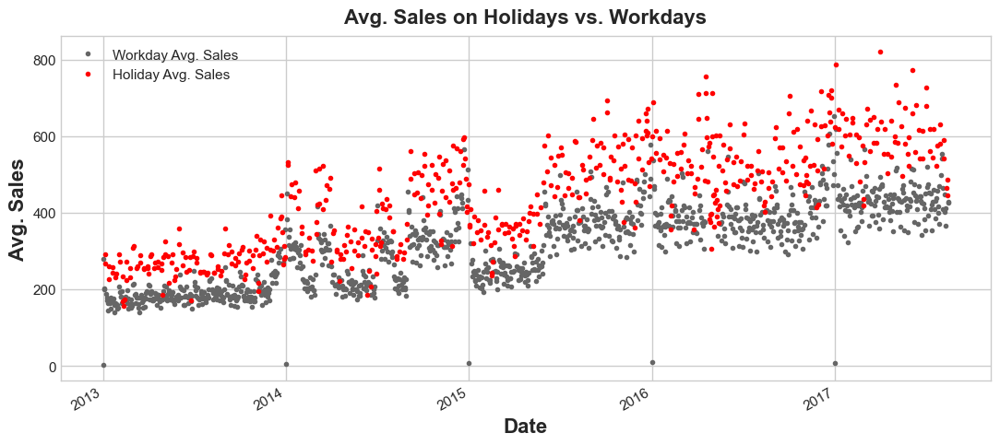

In [175]:
avg_sales_holiday=train_eda[train_eda.is_holiday==1].groupby('date')['sales'].mean() ## Grouping by holidays
avg_sales_workday=train_eda[train_eda.is_holiday==0].groupby('date')['sales'].mean() ## Grouping by workdays

_=avg_sales_workday.plot(color='0.4',style='.', legend=True, label='Workday Avg. Sales')
_=avg_sales_holiday.plot(color='red',style='.', legend=True, label='Holiday Avg. Sales')
plt.xlabel('Date',fontsize=16)
plt.ylabel('Avg. Sales',fontsize=16)
plt.title('Avg. Sales on Holidays vs. Workdays',fontsize=16)

plt.show()

# EDA: Sales vs Oil Prices

Higher oil prices tend to make production more expensive for businesses, just as they make it more expensive for households to do the things they normally do. It turns out that oil and gasoline prices are indeed very closely related.

I belive that Favorita Supermarkets chain have impacted from daily oil prices on thier sales,so as what I did at the last section, I will merge oil dataset with train dataset to get insights.



In [184]:
## Merging and Filling nans:
oil = oil.set_index('date')
train_eda=pd.merge(left=train_eda,right=oil,left_index=True,right_index=True,how='left')

train_eda.rename({'dcoilwtico':'oil_price'},axis=1,inplace=True)

train_eda['oil_price']=train_eda['oil_price'].fillna(method='ffill').fillna(method='bfill').astype('float16')

The correlation between average sales & oil price is:  -0.6269 



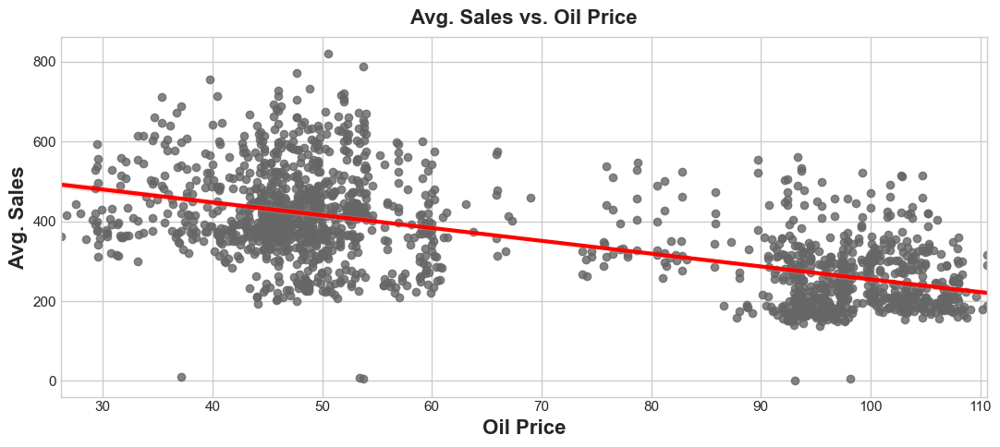

In [186]:
avg_sales = train_eda.groupby(['date','oil_price'])['sales'].mean().reset_index() ## Grouping by oil_price

print('The correlation between average sales & oil price is: ',
      np.round(avg_sales[['sales','oil_price']].corr().iloc[0,1],4),'\n')

# Plotting
sns.regplot(data=avg_sales, x='oil_price', y='sales', scatter_kws={'color':'0.4'},
           line_kws={'color':'red', 'linewidth':3})
plt.xlabel('Oil Price',fontsize=16)
plt.ylabel('Avg. Sales',fontsize=16)
plt.title('Avg. Sales vs. Oil Price',fontsize=16)
plt.show()

* At a consumer level, lower oil prices means more purchasing power for the customers. This explains why there's an increase in average sales since mid-2015.

* The chart above clearly tells us that when there are lower oil prices the average units sold increases. Therefore, oil prices will be used as a variable for training.

# EDA: Did Earthquake affect store sales?


A magnitude 7.8 earthquake struck Ecuador on April 16, 2016. People rallied in relief efforts donating water and other first need products which greatly affected supermarket sales for several weeks after the earthquake.

Comparing average sales by year, month and product family will be one of the best ways to be able to understand how earthquake had affected the store sales.

We can use the data of March, April, May and June and there may be increasing or decrasing sales for some product families.

Lastly, we extracted a column for earthquake from Holidays and Events data. "events_Terremoto_Manabi" column will help to fit a better model.

In [187]:
train['year_month'] = train['date'].dt.to_period('M').astype(str)

# group by year-month and calculate average sales
avg_sales = train.groupby('year_month')['sales'].mean()

In [192]:
avg_sales.head()

year_month
2013-01-01   186.95
2013-02-01   193.58
2013-03-01   206.88
2013-04-01   205.64
2013-05-01   209.94
Name: sales, dtype: float32

In [189]:
avg_sales.index = pd.to_datetime(avg_sales.index)

In [270]:
fig = go.Figure()

# Plot the average sales
fig.add_trace(go.Scatter(x=avg_sales.index, y=avg_sales.values.tolist(), mode='lines', name='Average Sales'))

earthquake_date = '2016-04-16'

# Add a vertical line for the earthquake in April 2016
fig.add_shape(
    go.layout.Shape(
        type="line",
        x0=earthquake_date,
        x1=earthquake_date,
        y0=avg_sales.values.min()-50,
        y1=avg_sales.values.max()+50,
        line=dict(color="red", dash="dash")
    )
)
fig.add_annotation(
    x=earthquake_date,
    y=avg_sales.values.max(),  # Positioning at the top
    text="16 Apr-2016 Earthquake",
    showarrow=True,
    arrowhead=2,
    ax=40,  # Adjusting text position
    ay=-40,
    bgcolor="white"
)

# Calculate the start and end dates for the 10-day range
start_date = '2012-11-1'
end_date = '2017-8-30'


fig.update_layout(
    xaxis=dict(title='Year-Month', range=[start_date, end_date],title_font=dict(size=16),  # Y-axis title font size
        tickfont=dict(size=12)),
    yaxis=dict(title='Sales',title_font=dict(size=16),  # Y-axis title font size
        tickfont=dict(size=12)),
    title=dict(
        text="Average Sales Over Time",
        x=0.5,  # Centers the title
        xanchor="center"  # Ensures proper centering
    ),
    showlegend=False,
    height=400,
    margin=dict(l=5, r=10, t=40, b=30)
)


fig.show()

# ARIMA